In [3]:
#!pip install gensim

Defaulting to user installation because normal site-packages is not writeable


In [4]:
#!pip install matplotlib

Defaulting to user installation because normal site-packages is not writeable


In [5]:
from regexp import word_tokenize
import re
import gensim
from gensim.models import Word2Vec

In [6]:
with open("ziyoUz-lt.txt") as f:
  gaplar = f.read().splitlines()

data = []

for gap in gaplar:
  temp = []
  gap = re.sub(' - ', '', gap)
  for soz in word_tokenize(gap):
    temp.append(soz.lower())
  data.append(temp)

data[1]

['rostdan', 'ham', 'hamxonam', 'tuturiqsiz', 'odamga', "o'xshaydi"]

In [7]:
model_cbow = gensim.models.Word2Vec(data, min_count = 1,
                              vector_size = 100, window = 5)

In [8]:
model_cbow.corpus_total_words

19824308

In [9]:
model_cbow.corpus_count

1760402

In [10]:
print("Kosinuslar orasidagi o'xshashlik 'salom' " +
               "va 'tamom' - CBOW : ",
    model_cbow.wv.similarity('salom', 'tamom'))

print("Kosinuslar orasidagi o'xshashlik 'mushuk' " +
                 "va 'sichqon' - CBOW : ",
      model_cbow.wv.similarity('mushuk', 'sichqon'))

Kosinuslar orasidagi o'xshashlik 'salom' va 'tamom' - CBOW :  -0.083827615
Kosinuslar orasidagi o'xshashlik 'mushuk' va 'sichqon' - CBOW :  0.75413585


In [11]:
model_sg = gensim.models.Word2Vec(data, min_count = 1, vector_size = 100,
                                             window = 5, sg = 1)

In [12]:
print("Kosinuslar orasidagi o'xshashlik 'salom' " +
               "va 'tamom' - Skip Gram : ",
    model_sg.wv.similarity('salom', 'tamom'))

print("Kosinuslar orasidagi o'xshashlik 'mushuk' " +
                 "va 'sichqon' - Skip Gram : ",
      model_sg.wv.similarity('mushuk', 'sichqon'))

Kosinuslar orasidagi o'xshashlik 'salom' va 'tamom' - Skip Gram :  0.33208916
Kosinuslar orasidagi o'xshashlik 'mushuk' va 'sichqon' - Skip Gram :  0.79069704


In [13]:
similar_words = model_cbow.wv.most_similar(positive=['katta'], topn=10)

print("'katta'ga o'xshash so'zlar:")
for word, similarity in similar_words:
    print(f"{word}: {similarity}")

'katta'ga o'xshash so'zlar:
kichik: 0.7423782348632812
ulkan: 0.7365218997001648
kichkina: 0.6136897206306458
kattagina: 0.5975790023803711
alohida: 0.5622379183769226
zo'r: 0.5587033629417419
kattaroq: 0.5364976525306702
yirik: 0.5308445692062378
keng: 0.5243014097213745
kuchli: 0.5216023325920105


In [14]:
similar_words = model_sg.wv.most_similar('katta', topn=10)

print("'katta'ga eng o'xshash so'zlar:")
for word, similarity in similar_words:
    print(f"{word}: {similarity}")

'katta'ga eng o'xshash so'zlar:
kichik: 0.8378984928131104
ulkan: 0.8331455588340759
kattagina: 0.7614685893058777
kichkina: 0.7481610774993896
katga: 0.7333052754402161
kattaroq: 0.7044181823730469
keng: 0.6772383451461792
katta-katta: 0.67719566822052
kichikroq: 0.6756466031074524
kuchli: 0.66794753074646


In [15]:
model_cbow.predict_output_word(['konstitutsiyasi'], topn=10)

[('davlat', 4.7653048e-06),
 ('sovet', 4.7061885e-06),
 ("o'zbekiston", 4.4995795e-06),
 ('islom', 4.110271e-06),
 ('turkiston', 3.917453e-06),
 ("sho'ro", 3.824686e-06),
 ('yevropa', 3.6185654e-06),
 ('rus', 3.4353122e-06),
 ('jahon', 3.3715332e-06),
 ('xitoy', 3.31432e-06)]

In [16]:
model_sg.predict_output_word(['konstitutsiyasi'], topn=10)

[('aqsh', 9.7555545e-05),
 ('respublikasi', 8.182839e-05),
 ('joriy', 8.180824e-05),
 ("o'zbekiston", 7.121311e-05),
 ('milliy', 6.969132e-05),
 ('xalqaro', 6.813597e-05),
 ('rossiya', 6.212908e-05),
 ('islom', 6.1614875e-05),
 ('turkiya', 6.108632e-05),
 ('turkiston', 5.8559628e-05)]

In [17]:
model_cbow.wv.get_index("kitobdagi")

14287

In [18]:
model_sg.wv.get_index("kitobdagi")

14287

In [19]:
for index, word in enumerate(model_cbow.wv.index_to_key):
    if index == 10:
        break
    print(f"index: {index}/{len(model_cbow.wv.index_to_key)}, so'z: {word}")

index: 0/931660, so'z: va
index: 1/931660, so'z: ham
index: 2/931660, so'z: bilan
index: 3/931660, so'z: bir
index: 4/931660, so'z: bu
index: 5/931660, so'z: u
index: 6/931660, so'z: edi
index: 7/931660, so'z: -
index: 8/931660, so'z: shu
index: 9/931660, so'z: deb


In [20]:
oquvchi_vec = model_cbow.wv.get_vector("o'quvchi")
oquvchi_vec

array([-2.238718  ,  1.0940154 ,  0.8167895 ,  0.5131189 ,  0.39988592,
       -1.066756  , -0.1452567 ,  1.0627987 ,  0.27470464, -0.33701807,
       -1.5546368 ,  0.07742924, -0.08076265,  0.07942725,  1.4874381 ,
       -0.8381094 , -1.8795664 ,  0.59710675, -0.46148542, -1.2295548 ,
        3.0161033 , -1.3696984 ,  0.90074116,  1.7761738 ,  0.80271995,
       -0.8804615 , -1.7199748 , -1.9386538 , -1.1557509 , -0.7783395 ,
       -0.8349999 ,  0.05062098, -0.2858778 , -2.1422966 , -0.39364037,
       -0.37591183, -3.8298688 , -0.717014  , -0.5677535 , -0.74359304,
       -0.31104583, -0.7541148 , -1.5519215 , -1.1074845 , -1.9726964 ,
        0.05269098,  0.64047277,  0.86367595,  0.62579536,  1.1141803 ,
        1.4639294 , -1.5911698 ,  0.8625747 ,  1.8526691 , -0.4681766 ,
        0.04813844, -0.8875084 , -1.593037  ,  0.84131557,  1.6339662 ,
       -0.8670782 ,  1.0432464 , -1.3630115 ,  1.0240183 ,  1.2416408 ,
       -1.3678659 ,  2.283601  , -0.6429742 , -0.42593485, -1.17

In [21]:
qiz_vec = model_cbow.wv['qiz']
qiz_vec

array([-1.132544  ,  1.4468238 , -1.1428097 , -4.0509567 ,  0.54662466,
        0.8139211 , -1.1283802 ,  1.8962262 ,  0.1807833 , -3.0060499 ,
       -1.0413814 ,  0.2939461 , -0.357604  ,  1.3370801 ,  0.07632465,
        0.29078984, -1.3830092 , -0.35390666,  1.5430754 ,  1.7175975 ,
        1.4821461 , -1.3385528 ,  0.2493253 ,  2.402208  ,  3.2399807 ,
       -2.9550214 , -2.2241502 ,  0.61323166, -0.20660889,  1.7293658 ,
       -1.2324692 , -0.01515548, -3.2739532 , -1.9286103 , -1.1862065 ,
        0.6094422 , -1.7329013 , -0.7066397 , -0.0069184 , -1.6635956 ,
        1.7056096 , -0.31239793, -1.3364667 ,  0.30415264,  0.47434336,
        0.5966725 ,  0.16328964, -3.344872  ,  2.968822  ,  0.05632741,
        2.3287718 , -2.5830016 ,  1.5659941 ,  2.0123315 , -0.5040358 ,
        0.95132947,  2.4781098 , -2.7498717 , -0.60820264, -0.15221968,
        2.9050484 , -0.19421598,  0.19859987, -0.00888469,  1.6715237 ,
       -0.6972857 ,  2.1895075 , -0.3557003 , -0.47684193, -2.95

In [22]:
yigit_vec = model_cbow.wv['yigit']
yigit_vec

array([-0.9846711 ,  1.9830306 , -1.4462795 , -4.3426123 ,  0.45034721,
        1.3192567 , -1.5910116 ,  2.958374  ,  1.0477272 , -2.8265462 ,
       -1.1455367 , -1.3487645 , -0.9878179 ,  2.200357  , -0.5403005 ,
       -0.9058357 , -1.8367877 , -0.90042114,  0.3196893 ,  1.6781527 ,
        1.9245297 , -2.1189134 ,  1.2966789 ,  1.3719614 ,  1.858173  ,
       -2.006213  , -1.5470688 ,  0.7399894 , -0.19092421,  2.6169841 ,
       -1.0516417 , -0.119999  , -2.7890644 , -1.875454  , -2.1412065 ,
       -0.52982235, -0.57433164, -0.02634664,  0.37736925, -0.35270953,
        1.5388236 , -1.921264  , -2.0098047 ,  1.0700433 , -0.04815225,
        0.3821135 ,  1.0799065 , -1.9318682 ,  1.939874  , -0.3644217 ,
        3.2297451 , -2.021664  ,  0.07219019,  1.2994218 , -0.8824355 ,
        0.4490186 ,  1.3247843 , -2.5246732 , -1.8918976 ,  0.4351597 ,
        3.223448  , -0.8071308 ,  0.3289696 ,  0.39264092,  2.4465137 ,
       -0.7342443 ,  0.8917328 ,  0.91264933,  0.03003446, -2.95

In [23]:
model_cbow.wv.similar_by_vector(oquvchi_vec - qiz_vec + yigit_vec, topn=10)

[("o'quvchi", 0.833793580532074),
 ('ijodkor', 0.7336255311965942),
 ('kitobxon', 0.732026219367981),
 ('yozuvchi', 0.6604955196380615),
 ('adib', 0.6512198448181152),
 ('ijodkorlar', 0.6473373770713806),
 ("san'atkor", 0.6384682655334473),
 ("o'quvchining", 0.622421145439148),
 ('shaxs', 0.6168035268783569),
 ('omma', 0.6124134063720703)]

In [24]:
farzand_vec = model_cbow.wv['farzand']
farzand_vec

array([-1.1226124 ,  0.5784873 ,  1.4457103 , -0.08720046, -0.5697796 ,
        0.40178967, -0.04463025,  1.0689636 ,  0.7591172 , -1.5283073 ,
       -1.0697674 ,  1.5510964 , -0.22671351,  1.6700273 ,  0.08227025,
       -0.2453579 , -1.0327361 , -0.06863309,  1.8938726 ,  0.9149926 ,
       -0.10772374,  0.6044246 ,  1.4240992 ,  0.60193497,  2.694112  ,
       -1.2310997 , -0.9265473 ,  0.9571781 , -2.4909136 ,  1.6040201 ,
       -0.8808502 , -0.8162602 , -1.6874701 , -0.27635357,  0.29701024,
        2.948077  , -0.9397707 , -1.4248911 , -1.3205587 , -2.9437387 ,
        0.09185519, -2.973173  , -0.04768357,  0.11601471,  1.1696764 ,
        0.60998493,  0.46011078, -4.211081  ,  3.7632458 , -1.683186  ,
        0.68296254, -1.8457443 ,  1.2780329 ,  0.7134511 ,  2.0305374 ,
       -1.4911476 ,  0.45158243, -3.355352  , -0.05551782, -0.43290684,
        1.6129805 , -0.10936939, -0.4237377 , -1.7989037 , -0.39109424,
        0.26044872,  3.047771  ,  1.1298001 ,  0.09790587, -0.13

In [25]:
ogil_vec = model_cbow.wv["o'g'il"]
ogil_vec

array([-1.2245767 , -0.06254824,  1.4580654 , -0.5077596 ,  1.5986881 ,
        0.47385186, -2.0972526 ,  1.0584358 , -0.0539333 , -2.62664   ,
       -0.08841475, -0.17236598,  0.18865055,  1.146141  ,  0.03970388,
       -0.70959926, -1.255956  , -0.29216966,  1.9556029 ,  1.3964757 ,
        0.389353  , -0.17625926,  1.3409309 ,  1.976695  ,  2.2790067 ,
       -1.7712425 , -0.8084651 ,  0.01343033, -1.4968771 ,  2.2937524 ,
       -1.6125454 , -0.5516462 , -1.1616007 , -1.0890913 ,  0.7477166 ,
        2.6794512 , -1.3277073 , -1.809957  , -1.5411017 , -3.5112948 ,
       -1.6631428 , -1.6193366 , -0.5605223 ,  2.2941654 ,  0.8820626 ,
        0.916086  ,  0.03930474, -4.8502593 ,  2.0486407 , -1.7329272 ,
        0.9037122 , -1.756721  ,  2.076098  ,  0.27996227,  1.3729593 ,
       -0.29002202,  1.2220615 , -2.0793583 ,  0.8785743 , -0.1919091 ,
        1.7281296 , -2.2755914 , -0.36807078, -1.7797824 , -0.7600556 ,
        0.68199205,  1.3076382 ,  0.32092303, -0.13678677, -1.42

In [26]:
model_cbow.wv.similar_by_vector(farzand_vec - qiz_vec + ogil_vec, topn=10)

[('farzand', 0.8233819603919983),
 ("o'g'il", 0.735097348690033),
 ('farzandlar', 0.6951751708984375),
 ('ota-ona', 0.6477706432342529),
 ('farzandni', 0.6449124217033386),
 ('farzandning', 0.6197640299797058),
 ('oilada', 0.6093568801879883),
 ("o'g'ilni", 0.5956912040710449),
 ('farzandlari', 0.5944333076477051),
 ('farzandi', 0.5935918688774109)]

In [27]:
ozbekiston_vec = model_sg.wv["o'zbekiston"]
ozbekiston_vec

array([-0.25394967,  0.9675819 ,  0.8521945 ,  0.9603627 ,  0.04718154,
       -0.24162602, -0.46404666,  1.3502289 , -0.8188349 ,  0.34224373,
        0.11280411, -0.1398365 ,  0.20019615, -0.3519776 , -0.06714338,
       -0.42470044, -0.12846524, -0.35221764, -1.3235592 , -0.98606205,
        0.6473889 ,  0.22682011,  0.8810673 , -0.37028104,  0.2403203 ,
        0.9755438 , -0.5873734 , -0.04977003, -0.3138071 , -0.3773423 ,
        0.03093047, -0.2760431 ,  0.3173185 , -0.01822197,  0.48569295,
       -0.57543427,  0.53287154, -0.66751957, -0.9812013 , -1.1358302 ,
       -1.0191984 , -0.23200867, -0.11497077,  0.23784818, -0.5356552 ,
       -0.5212243 , -0.5807443 , -0.04975335, -0.14217168, -0.28430617,
        0.01353733,  0.11794524, -0.35171044, -0.28091085, -0.5094469 ,
        0.45336348, -0.24801295, -0.5578156 , -0.24217953,  0.25657752,
        0.2752853 , -0.7538429 , -0.457098  ,  0.13777943, -0.45262706,
        0.0200862 ,  0.40022472,  1.0901865 , -0.8585232 , -0.06

In [28]:
toshkent_vec = model_sg.wv["toshkent"]
toshkent_vec

array([-0.50567925,  1.1624146 ,  0.47972584,  0.4177782 , -0.01510283,
       -0.94612956, -0.24203618,  0.8170297 , -0.49028793,  0.34120548,
        0.1366693 , -0.6545673 ,  0.6161187 ,  0.1540918 , -0.44456267,
       -0.5064276 , -0.5653907 ,  0.1372487 , -1.0163631 , -0.830096  ,
        0.23600298,  0.98529774,  0.8608273 , -0.21853267,  0.36299205,
        0.6939293 , -0.35833192,  0.06353091, -0.48962617, -0.07633903,
       -0.05701263, -0.49984717,  0.11064173, -0.06352974,  0.38283876,
        0.47013378,  0.46925342, -0.29932258, -0.19587009, -0.24460974,
       -0.7810324 ,  0.10937843,  0.3199628 ,  0.10634372,  0.04874573,
       -0.19217059, -0.4812954 , -0.6243092 ,  0.06194975, -0.09031082,
        0.41043758,  0.2676378 , -0.8965851 , -0.47615477, -0.11737421,
        0.59502465, -0.2906995 , -0.5339213 ,  0.16053937,  0.13002804,
        0.25250363, -0.48741522, -0.43366778, -0.5218569 , -0.39883214,
       -0.03068629,  0.6197362 ,  0.7824763 , -0.24434625, -0.14

In [29]:
anqara_vec = model_sg.wv["anqara"]
anqara_vec

array([-0.30679977,  0.7916451 ,  0.24640653,  0.73560196, -0.37261432,
       -0.31805593, -0.11368464,  0.7750917 , -0.54109424,  0.40732667,
        0.05282324, -0.46035483,  0.300496  ,  0.1886902 , -0.0663119 ,
       -0.11904886, -0.60441834,  0.29300302, -1.0430044 , -0.8721188 ,
        0.43268695,  0.36595243,  0.5880907 , -0.38930652,  0.14404958,
        0.7517923 ,  0.28125566, -0.22144285, -0.5968947 , -0.0201651 ,
        0.3448877 , -0.43348646,  0.5540594 , -0.54672956,  0.34655875,
       -0.16951232,  0.1257425 , -0.3999907 , -0.13292739, -0.42534262,
       -0.32949346, -0.3130034 ,  0.4421874 , -0.20734607, -0.04696382,
        0.22803958, -0.7061796 ,  0.05695485,  0.6338601 ,  0.24576285,
       -0.16887747,  0.35131416, -0.76003534, -0.7420762 , -0.10177294,
       -0.05397146,  0.26751396, -0.7876734 , -0.13663527, -0.07146113,
        0.43507025, -0.22379415, -0.18635528,  0.06728716, -0.06082033,
        0.43843138, -0.05261045,  0.47540894, -0.17516342,  0.80

In [30]:
model_sg.wv.similar_by_vector(ozbekiston_vec - toshkent_vec + anqara_vec)

[('turkiya', 0.8480668067932129),
 ("o'zbekiston", 0.8238862752914429),
 ('turkmaniston', 0.809852123260498),
 ('ittifoqi', 0.793192446231842),
 ('jazoir', 0.7881960272789001),
 ('prezidentlar', 0.7859834432601929),
 ('toyyib', 0.7836779356002808),
 ('yei', 0.778797447681427),
 ('malayziya', 0.7726765871047974),
 ('anqara', 0.7722650766372681)]

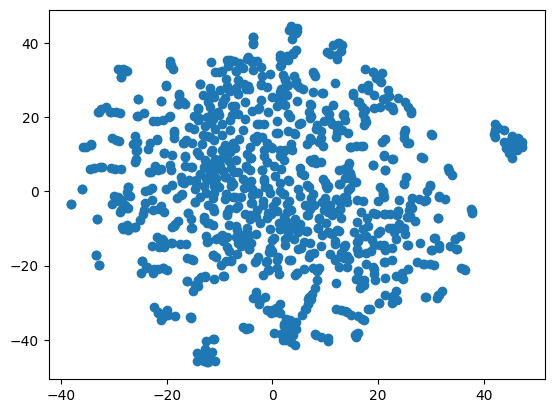

In [31]:
import gensim
import gensim.models as g
from sklearn.manifold import TSNE
import re
import matplotlib.pyplot as plt

#modelPath = "/path/to/your/model"
model = model_cbow

X = model.wv[model.wv.key_to_index]
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(X[:1000,:])

plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.show()

In [32]:
X = model.wv[model.wv.key_to_index]
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(X[:10000,:])

fig = plt.figure(figsize=(300, 240))
ax = fig.add_subplot(1, 1, 1)

ax.scatter(X_tsne[:, 0], X_tsne[:, 1])

for i, word in enumerate(model.wv.key_to_index):
    ax.annotate(word, (X_tsne[i, 0], X_tsne[i, 1]))

plt.show()

IndexError: index 10000 is out of bounds for axis 0 with size 10000

In [ ]:
from gensim.models import Word2Vec
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Load your trained Word2Vec model
#Word2Vec.load('/path/to/your/model')
model = model_cbow

# Get the vectors for the words in the vocabulary
X = model.wv[model.wv.key_to_index]

# Perform hierarchical clustering on the vectors
Z = linkage(X[:1000], 'ward')

fig = plt.figure(figsize=(200, 160))


# Plot the dendrogram
dendrogram(Z, labels=model.wv.index_to_key[:100], leaf_rotation=90)

plt.setp(plt.gca().get_lines(), linewidth=10)

plt.gca().tick_params(axis='x', labelsize=20)

plt.show()